In [1]:
using JSServe
Page()

In [7]:
import WGLMakie, Makie

In [8]:
using FunctionalCollections

In [9]:
@enum GridSquare empty wall agent

In [10]:
"""A world state for a 2D Grid environment."""
abstract type GridWorld end
Base.size(::GridWorld) = error("Not implemented.")
agentpos(::GridWorld) = error("Not implemented.")
Base.getindex(::GridWorld, x, y) = error("Not implemented.")
replace(::GridWorld, x, y, square) = error("Not implemented.")
function moveagent(w::GridWorld, x, y)
    w = replace(w, agentpos(w)..., empty)
    w = replace(w, x, y, agent)
    return w
end

"""Functional implementation of a GridWorld."""
struct FGridWorld <: GridWorld
    squares::PersistentVector{PersistentVector{GridSquare}}
    agentpos::Union{Nothing, Tuple{Int, Int}}
    size::Tuple{Int, Int}
end
function FGridWorld(g::Matrix{GridSquare}, pos::Union{Nothing, Tuple{Int, Int}}, size::Tuple{Int, Int})
    FGridWorld(
        pvec([pvec([g[x, y] for y=1:size[2]]) for x=1:size[1]]),
        pos,
        size
    )
end

Base.size(w::FGridWorld) = w.size
Base.getindex(w::FGridWorld, x, y) = w.squares[x][y]
agentpos(w::FGridWorld) = w.agentpos
function replace(w::FGridWorld, x, y, s)
    agent_pos =
      s == agent            ? (x, y)  :
      agentpos(w) == (x, y) ? nothing : 
                              agentpos(w)

    return FGridWorld(
        assoc(w.squares, x, assoc(w.squares[x], y, s)),
        agent_pos,
        w.size
    )
end

replace (generic function with 2 methods)

In [11]:
function FGridWorld(g::Matrix{GridSquare}, pos::Union{Nothing, Tuple{Int, Int}}, size::Tuple{Int, Int})
    FGridWorld(
        pvec([pvec([g[x, y] for y=1:size[2]]) for x=1:size[1]]),
        pos,
        size
    )
end

FGridWorld

In [23]:
"""Makie plotting recipe for plotting a GridWorld"""
Makie.@recipe(GridWorldPlot) do scene
    Makie.Attributes(
        squarecolors = Dict(
            empty => :white,
            wall => :black,
            agent => :red
        )
    )
end
function Makie.plot!(g::GridWorldPlot{<:Tuple{<:GridWorld}})
    w = g[1] # get the gridworld

    # plot the squares
    rects = [Makie.Rect2( (x - 1, y - 1), (1, 1) ) for x in 1:w[].size[1] for y in 1:w[].size[2]]
    colors = Makie.@lift([$(g.squarecolors)[$w[x, y]] for x in 1:w[].size[1] for y in 1:w[].size[2]])
    Makie.poly!(g, rects, color = colors)

    g
end

In [78]:
"""
Visualize a GridWorld.
"""
function visualize_grid(w::GridWorld)
    f = Makie.Figure(resolution=(400, 400))
    ax = Makie.Axis(f[1, 1], aspect=Makie.DataAspect())
    Makie.hidedecorations!(ax)
    gridworldplot!(ax, w)
    f
end

visualize_grid

In [79]:
w = FGridWorld([wall empty empty; wall empty empty; wall wall wall], nothing, (3, 3))

FGridWorld(PersistentVector{GridSquare}[[wall, empty, empty], [wall, empty, empty], [wall, wall, wall]], nothing, (3, 3))

In [80]:
visualize_grid(w)

In [27]:
"""
HouseExpo PNG -> GridWorld
"""

"HouseExpo PNG -> GridWorld\n"

In [28]:
using FileIO

In [29]:
pngpath = "./HouseExpoPng/"
filename = readdir(pngpath)[1]
img = load(joinpath(pngpath, filename))
typeof(img)

Matrix{Gray{N0f8}} (alias for Array{ColorTypes.Gray{FixedPointNumbers.Normed{UInt8, 8}}, 2})

In [30]:
is_filled_matrix = map(x -> x < 0.9, img)
sum(is_filled_matrix) / prod(size(is_filled_matrix))

0.3635973792871732

In [31]:
[b ? RGB(0, 0, 0) : RGB(1, 1, 1) for b in is_filled_matrix[1:100, 1:100]]

LoadError: UndefVarError: `RGB` not defined

In [91]:
"""
i = "Image" boolean matrix; each pixel is a 1 if it is filled
and 0 if it is empty.
px, py = pixel dimensions
gx, gy = grid dimensions
"""
function boolmatrix_to_grid(i::Matrix, (gx, gy)::Tuple)
    (px, py) = size(i)
    pix_per_grid = px/gx
    minpx(gx) = 1 + (gx - 1) * pix_per_grid |> floor |> Int
    maxpx(gx) = gx * pix_per_grid |> ceil |> Int
    is_filled(gx, gy) = any(
        i[px, py]
            for px = minpx(gx):maxpx(gx)
            for py = minpx(gy):maxpx(gy)
    )
    
    return FGridWorld(
        [
            is_filled(x, y) ? wall : empty
            for x=1:gx,
                y=1:gy
        ],
        nothing,
        (gx, gy)
    )
end
function boolmatrix_to_grid(i::Matrix, gx::Int)
    px, py = size(i)
    gy = Int(ceil(py/px * gx))
    return boolmatrix_to_grid(i, (gx, gy)::Tuple)
end

boolmatrix_to_grid (generic function with 2 methods)

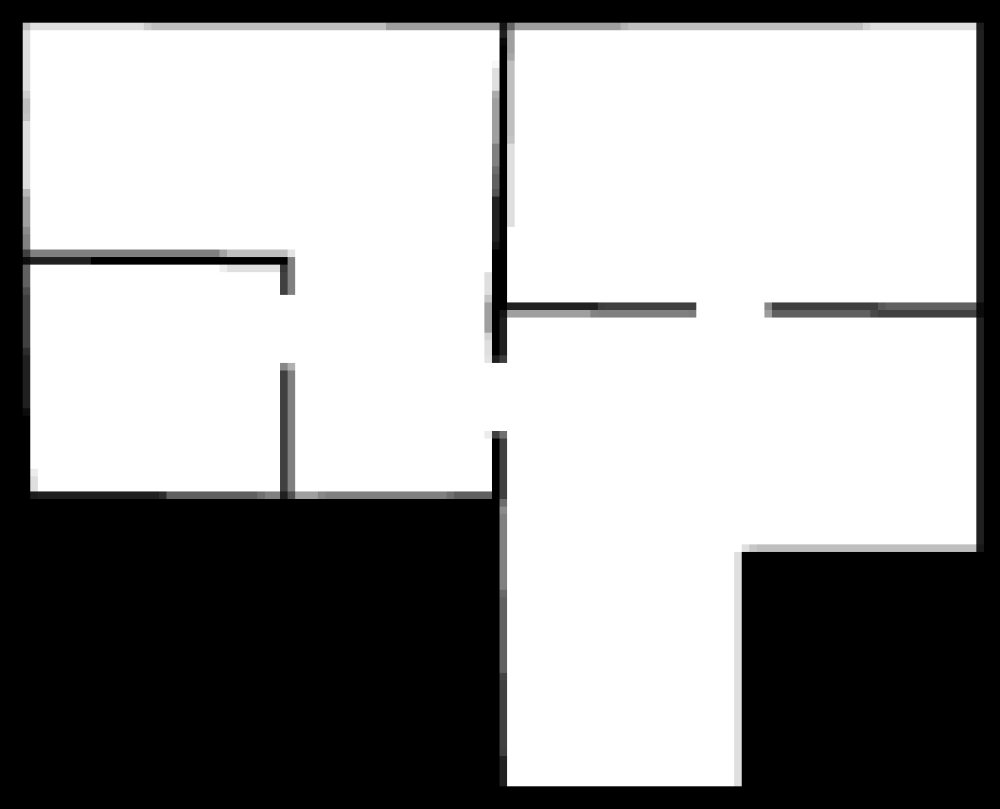

┌ Warning: Output swatches are reduced due to the large size (856×1057).
│ Load the ImageShow package for large images.
└ @ Colors ~/.julia/packages/Colors/mIuXl/src/display.jl:159


In [92]:
img

In [95]:
visualize_grid(boolmatrix_to_grid(is_filled_matrix, 100))

In [58]:
(px, py) = size(is_filled_matrix)
gx = 40
gy = Int(ceil(py/px * gx))

50

In [59]:
i = is_filled_matrix;

In [62]:
pix_per_grid

21.4

In [65]:
pix_per_grid = px/gx
minpx(gx) = 1 + (gx - 1) * pix_per_grid |> floor |> Int
maxpx(gx) = min(gx * pix_per_grid |> ceil |> Int, size(i)[2])
is_filled(gx, gy) = any(
    i[px, py]
        for px = minpx(gx):maxpx(gx)
        for py = minpx(gy):maxpx(gy)
)
filled_matrix(gx, gy) = 
    [i[px, py]
        for px = minpx(gx):maxpx(gx),
            py = minpx(gy):maxpx(gy)]
first_filled(gx, gy) = findfirst(filled_matrix(gx, gy))

first_filled (generic function with 1 method)

true
CartesianIndex(191, 1)


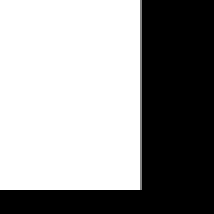

┌ Warning: Output swatches are reduced due to the large size (214×214).
│ Load the ImageShow package for large images.
└ @ Colors ~/.julia/packages/Colors/mIuXl/src/display.jl:159


In [66]:
gx, gy = 4, 4
println(any(is_filled(gx, gy)))
println(first_filled(gx, gy))
i2 = img[minpx(gx):maxpx(gx), minpx(gy):maxpx(gy)]

In [ ]:
@enum Action up down left right

In [ ]:
@gen (static) function transition(s::GridWorld, a::Action)
    
end